# Deep Convolutional Generative Adversarial Network

The code is written using the [Keras Sequential API](https://www.tensorflow.org/guide/keras) with a `tf.GradientTape` training loop.

### Import TensorFlow and other libraries

In [ ]:
from __future__ import absolute_import, division, print_function, unicode_literals

In [ ]:
import tensorflow as tf
tf.enable_eager_execution()

In [ ]:
tf.__version__

In [ ]:
# To generate GIFs
!pip install imageio

In [ ]:
!pip install pillow matplotlib

In [ ]:
import imageio
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
from glob import glob
from tensorflow.keras import layers, models
import time
from IPython import display
import random
import my_helper

In [ ]:
# data_dir = './'
# image_list = glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))
# print(len(image_list))
# print(image_list[0])

In [ ]:
# image_size = 64
# images = my_helper.get_batch(image_list, image_size, image_size, 'RGB')

# print(images.shape)

In [ ]:
# for i in range(images.shape[0]):
#     if i % 10000 == 9999:
#         print("Save {:06d}th image".format(i+1))
#     img = images[i].astype(np.uint8)
#     plt.imsave('crop_image/{:06d}.jpg'.format(i+1), img)

In [ ]:
image_list = os.listdir('crop_image/')
print(len(image_list))

In [ ]:
images = []
for i in range(len(image_list)):
    img = plt.imread('crop_image/' + image_list[i])
    images.append(img)
    
images = np.array(images).astype(np.float32)
print(images.shape)
print(len(images))

In [ ]:
images = images / 127.5 - 1.0 # Normalize the images to [-1, 1]

### Load and prepare the dataset


In [ ]:
BATCH_SIZE = 256
BUFFER_SIZE = len(images)
print(BUFFER_SIZE)

In [ ]:
# Batch and shuffle the data
train_dataset = tf.data.Dataset.from_tensor_slices(images).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

## Create the models

Both the generator and discriminator are defined using the [Keras Sequential API](https://www.tensorflow.org/guide/keras#sequential_model).

### The Generator

The generator uses `tf.keras.layers.Conv2DTranspose` (upsampling) layers to produce an image from a seed (random noise). Start with a `Dense` layer that takes this seed as input, then upsample several times until you reach the desired image size of 64x64x3. Notice the `tf.keras.layers.LeakyReLU` activation for each layer, except the output layer which uses tanh.

In [ ]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(4*4*1024, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization(epsilon=0.00005))
    model.add(layers.LeakyReLU(alpha=0.2))

    model.add(layers.Reshape((4, 4, 1024)))
    assert model.output_shape == (None, 4, 4, 1024) # Note: None is the batch size

    model.add(layers.Dropout(0.5))
    # 4x4x1024 -> 8x8x512
    model.add(layers.Conv2DTranspose(512, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 8, 8, 512)
    model.add(layers.BatchNormalization(epsilon=0.00005))
    model.add(layers.LeakyReLU(alpha=0.2))
    
    model.add(layers.Dropout(0.5))
    # 8x8x512 -> 16x16x256
    model.add(layers.Conv2DTranspose(256, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 16, 16, 256)
    model.add(layers.BatchNormalization(epsilon=0.00005))
    model.add(layers.LeakyReLU(alpha=0.2))
    
    model.add(layers.Dropout(0.5))
    # 16x16x256 -> 32x32x128
    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 32, 32, 128)
    model.add(layers.BatchNormalization(epsilon=0.00005))
    model.add(layers.LeakyReLU(alpha=0.2))

    # 32x32x128 -> 64x64x3
    model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    assert model.output_shape == (None, 64, 64, 3)

    return model

Use the (as yet untrained) generator to create an image.

In [ ]:
generator = make_generator_model()

noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)
print(type(generated_image))
print(generated_image.shape)
plt.imshow(((generated_image[0].numpy() + 1.0) * 127.5).astype(np.uint8))

### The Discriminator

The discriminator is a CNN-based image classifier.

In [ ]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    # 64x64x3 -> 32x32x64
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[64, 64, 3]))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))
    # 32x32x64 -> 16x16x128
    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))
    # 16x16x128 -> 8x8x256
    model.add(layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Flatten())
    model.add(layers.Dense(1))

    return model

Use the (as yet untrained) discriminator to classify the generated images as real or fake. The model will be trained to output positive values for real images, and negative values for fake images.

In [ ]:
discriminator = make_discriminator_model()
decision = discriminator(generated_image)
print(decision)

## Define the loss and optimizers

Define loss functions and optimizers for both models.


In [ ]:
# This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

### Discriminator loss

This method quantifies how well the discriminator is able to distinguish real images from fakes. It compares the discriminator's predictions on real images to an array of 1s, and the discriminator's predictions on fake (generated) images to an array of 0s.

In [ ]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output)*random.uniform(0.9, 1.0), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

### Generator loss
The generator's loss quantifies how well it was able to trick the discriminator. Intuitively, if the generator is performing well, the discriminator will classify the fake images as real (or 1). Here, we will compare the discriminators decisions on the generated images to an array of 1s.

In [ ]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output)*random.uniform(0.9, 1.0), fake_output)

The discriminator and the generator optimizers are different since we will train two networks separately.

In [49]:
generator_optimizer = tf.keras.optimizers.Adam(lr=0.0002, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(lr=0.0002, beta_1=0.5)

### Save checkpoints
This notebook also demonstrates how to save and restore models, which can be helpful in case a long running training task is interrupted.

In [50]:
from datetime import datetime
current_time = datetime.now()
# year month day hour minute second microsecond
print()

In [51]:
current_time = datetime.now()
current_time_naming = "{:02d}".format(current_time.month) + \
                      "{:02d}".format(current_time.day) +  "_" + \
                      "{:02d}".format(current_time.hour) + \
                      "{:02d}".format(current_time.minute) + \
                      "{:02d}".format(current_time.second)
os.mkdir(current_time_naming)
print(current_time_naming)
checkpoint_dir = "./training_checkpoints-" + current_time_naming
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

1103_121123


## Define the training loop



In [52]:
EPOCHS = 150
noise_dim = 100
num_examples_to_generate = 16

# We will reuse this seed overtime (so it's easier)
# to visualize progress in the animated GIF)
seed = tf.random.normal([num_examples_to_generate, noise_dim])

The training loop begins with generator receiving a random seed as input. That seed is used to produce an image. The discriminator is then used to classify real images (drawn from the training set) and fakes images (produced by the generator). The loss is calculated for each of these models, and the gradients are used to update the generator and discriminator.

In [53]:
# Notice the use of `tf.function`
# This annotation causes the function to be "compiled".
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)
        
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)
        
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)
        
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

#     discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
#     generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    
    tf.cond(gen_loss > disc_loss, 
            lambda: generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables)), 
            lambda: discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables)))

In [54]:
def train(dataset, epochs):
    for epoch in range(epochs):
        start = time.time()
        count = 0
        for image_batch in dataset:
            count += 1
            if count % 100 == 0:
                print("Batch {:02d}".format(count))
            train_step(image_batch)
            
        # Produce images for the GIF as we go
        #display.clear_output(wait=True)
        generate_and_save_images(generator,
                                 epoch + 1,
                                 seed)
        
        # Save the model every 10 epochs
        if (epoch + 1) % 10 == 0:
            checkpoint.save(file_prefix = checkpoint_prefix)
            
        print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))
        
    # Generate after the final epoch
    #display.clear_output(wait=True)
    generate_and_save_images(generator,
                             epochs,
                             seed)

**Generate and save images**



In [55]:
def generate_and_save_images(model, epoch, test_input):
    # Notice `training` is set to False.
    # This is so all layers run in inference mode (batchnorm).
    predictions = model(test_input, training=False)
    fig = plt.figure(figsize=(4,4))
    
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow(((predictions[i].numpy() + 1.0) * 127.5).astype(np.uint8))
        plt.axis('off')
        
    plt.savefig(current_time_naming + '/image_{:03d}.png'.format(epoch))
    plt.show()

## Train the model
Call the `train()` method defined above to train the generator and discriminator simultaneously. Note, training GANs can be tricky. It's important that the generator and discriminator do not overpower each other (e.g., that they train at a similar rate).

At the beginning of the training, the generated images look like random noise. As training progresses, the generated images will look increasingly real. This may take about one minute / epoch with the default settings on Colab.

Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


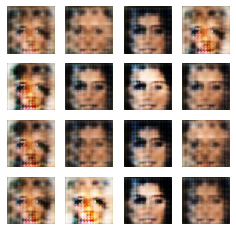

Time for epoch 1 is 158.7411015033722 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


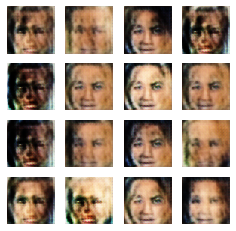

Time for epoch 2 is 152.11806964874268 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


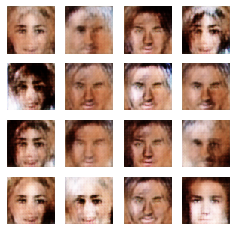

Time for epoch 3 is 152.18850255012512 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


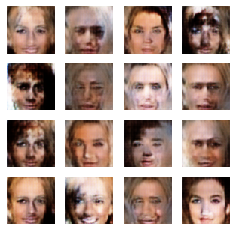

Time for epoch 4 is 152.23355960845947 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


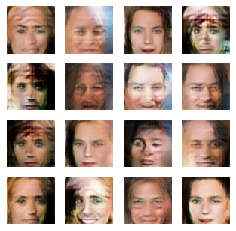

Time for epoch 5 is 152.0554175376892 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


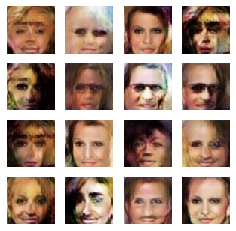

Time for epoch 6 is 152.67523384094238 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


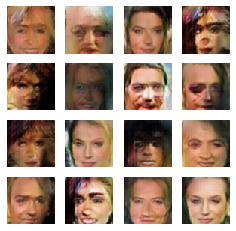

Time for epoch 7 is 151.7095386981964 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


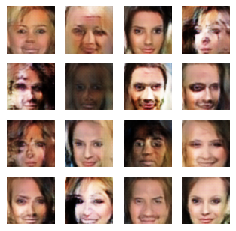

Time for epoch 8 is 152.7304859161377 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


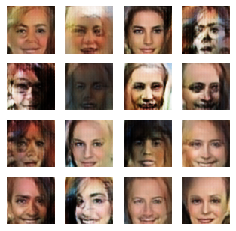

Time for epoch 9 is 152.1002881526947 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


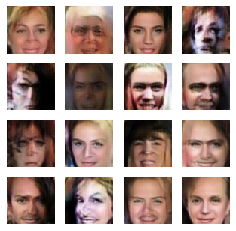

Time for epoch 10 is 152.3295497894287 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


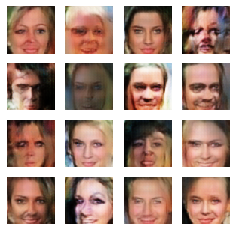

Time for epoch 11 is 152.17874598503113 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


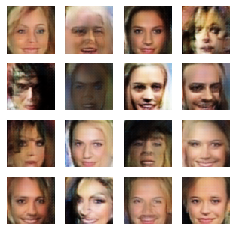

Time for epoch 12 is 151.89820528030396 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


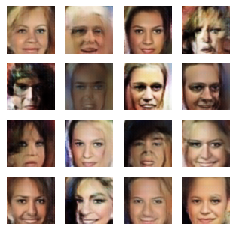

Time for epoch 13 is 152.3464801311493 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


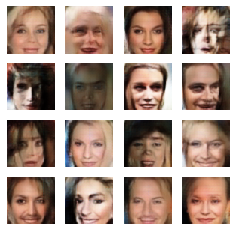

Time for epoch 14 is 152.2086160182953 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


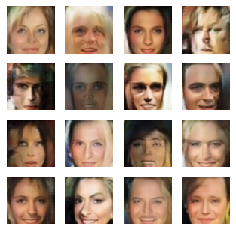

Time for epoch 15 is 152.06459641456604 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


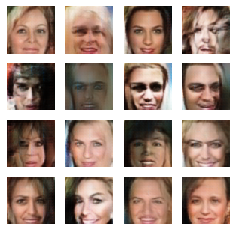

Time for epoch 16 is 151.93195629119873 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


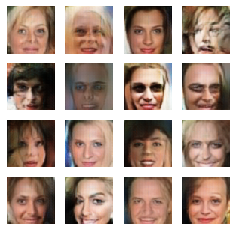

Time for epoch 17 is 152.4922993183136 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


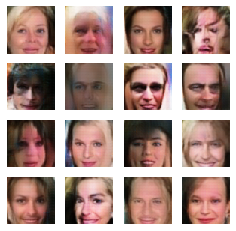

Time for epoch 18 is 152.4261109828949 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


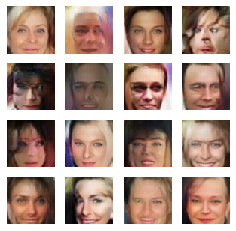

Time for epoch 19 is 153.47474265098572 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


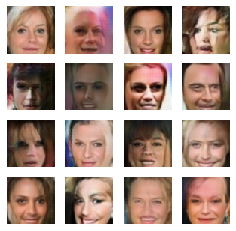

Time for epoch 20 is 153.4879219532013 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


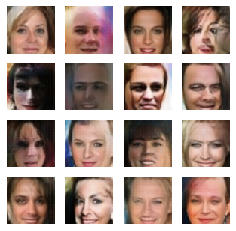

Time for epoch 21 is 152.98963356018066 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


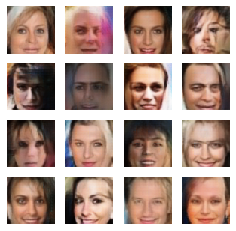

Time for epoch 22 is 152.92769956588745 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


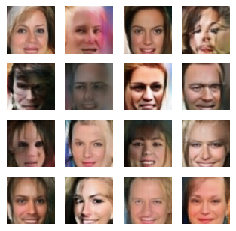

Time for epoch 23 is 152.2504906654358 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


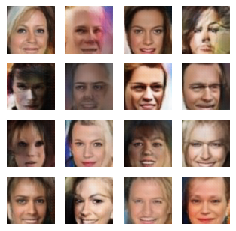

Time for epoch 24 is 152.64548540115356 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


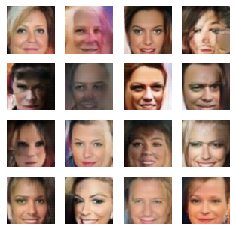

Time for epoch 25 is 153.740549325943 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


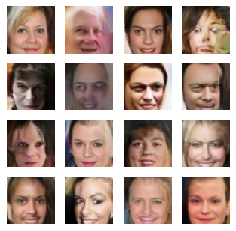

Time for epoch 26 is 152.97742009162903 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


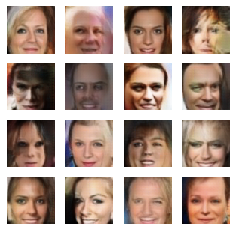

Time for epoch 27 is 152.69571161270142 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


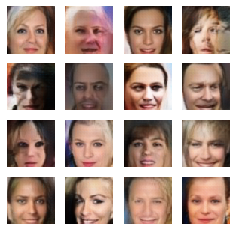

Time for epoch 28 is 152.10585832595825 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


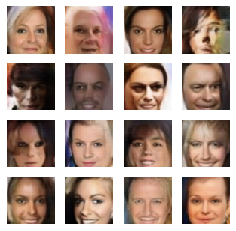

Time for epoch 29 is 151.84262251853943 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


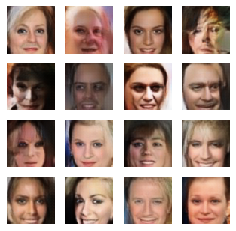

Time for epoch 30 is 152.0811116695404 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


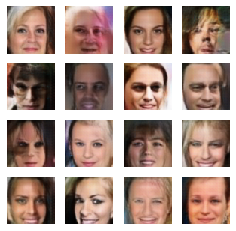

Time for epoch 31 is 152.10992217063904 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


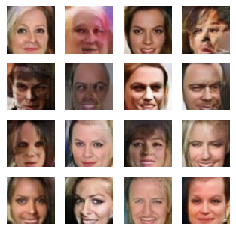

Time for epoch 32 is 152.1987166404724 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


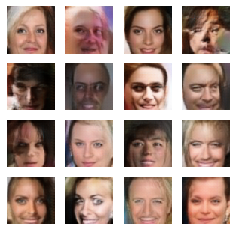

Time for epoch 33 is 151.73231196403503 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


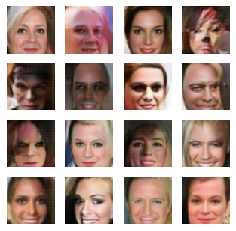

Time for epoch 34 is 152.80295634269714 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


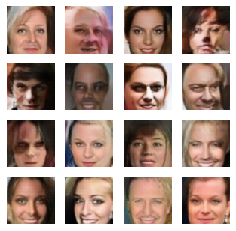

Time for epoch 35 is 152.78123211860657 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


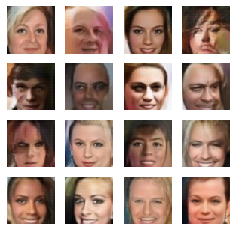

Time for epoch 36 is 152.9532310962677 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


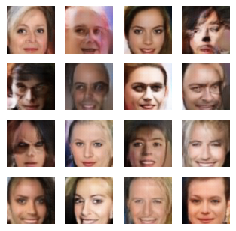

Time for epoch 37 is 152.75239419937134 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


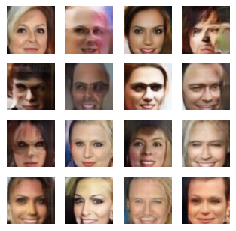

Time for epoch 38 is 152.53400182724 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


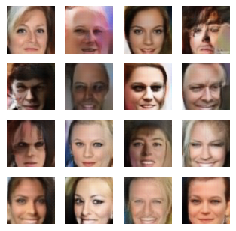

Time for epoch 39 is 152.40481400489807 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


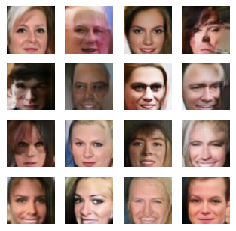

Time for epoch 40 is 152.6952531337738 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


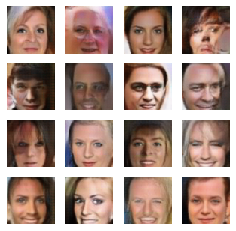

Time for epoch 41 is 152.7364490032196 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


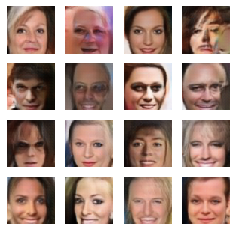

Time for epoch 42 is 151.7413067817688 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


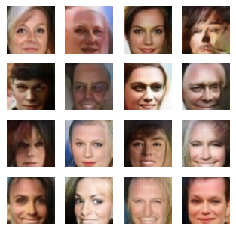

Time for epoch 43 is 152.37393021583557 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


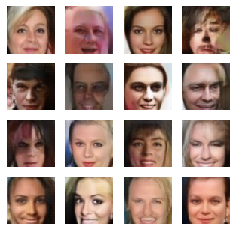

Time for epoch 44 is 152.67987537384033 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


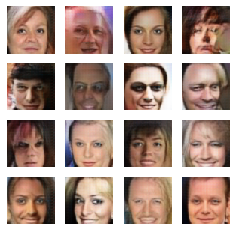

Time for epoch 45 is 152.2366235256195 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


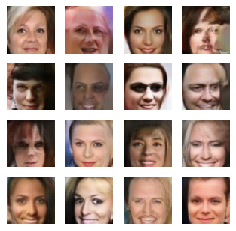

Time for epoch 46 is 152.57636952400208 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


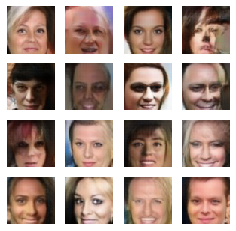

Time for epoch 47 is 152.57377529144287 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


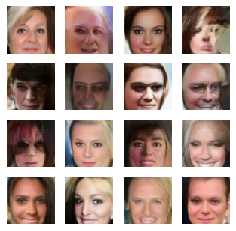

Time for epoch 48 is 153.28302335739136 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


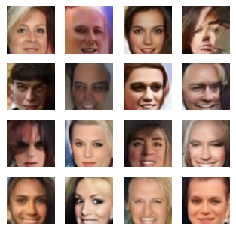

Time for epoch 49 is 152.51283478736877 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


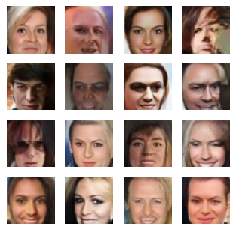

Time for epoch 50 is 152.76709461212158 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


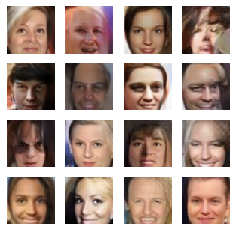

Time for epoch 51 is 152.01958012580872 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


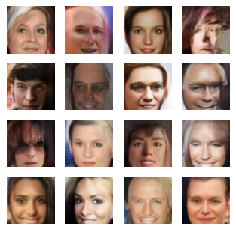

Time for epoch 52 is 152.46244931221008 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


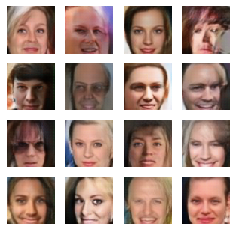

Time for epoch 53 is 151.8686182498932 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


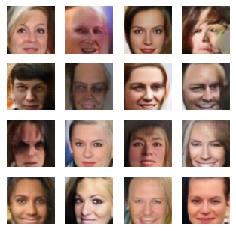

Time for epoch 54 is 152.1696445941925 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


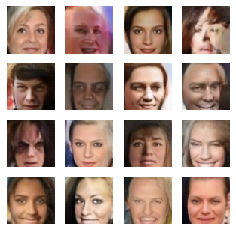

Time for epoch 55 is 152.21355986595154 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


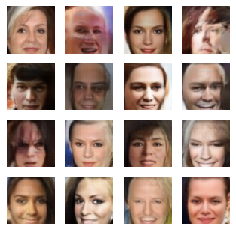

Time for epoch 56 is 151.9279544353485 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


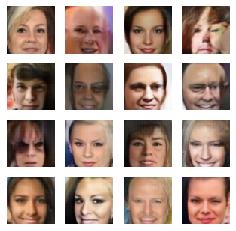

Time for epoch 57 is 152.02255654335022 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


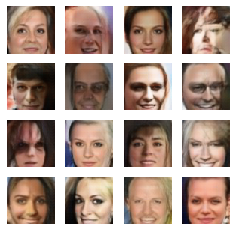

Time for epoch 58 is 152.89103531837463 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


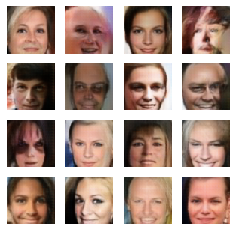

Time for epoch 59 is 152.48956084251404 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


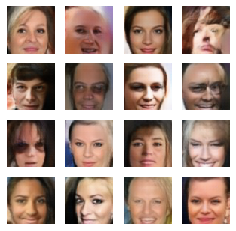

Time for epoch 60 is 152.625746011734 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


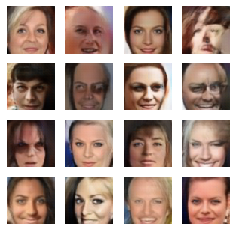

Time for epoch 61 is 152.3116796016693 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


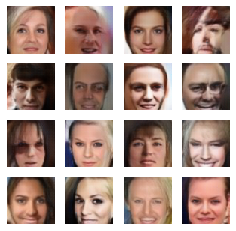

Time for epoch 62 is 152.7072093486786 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


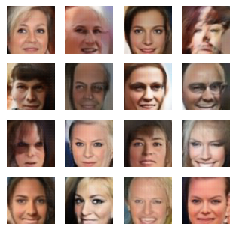

Time for epoch 63 is 152.42667865753174 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


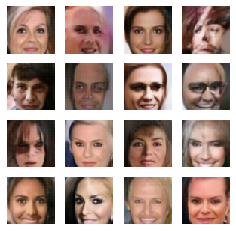

Time for epoch 64 is 152.8508129119873 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


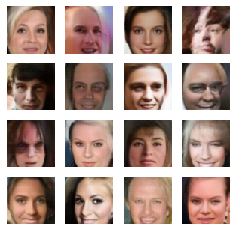

Time for epoch 65 is 152.87254524230957 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


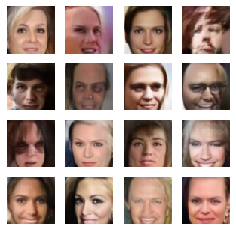

Time for epoch 66 is 151.85626101493835 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


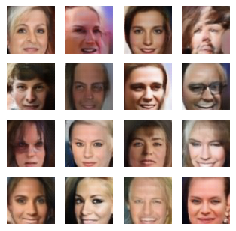

Time for epoch 67 is 151.83481407165527 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


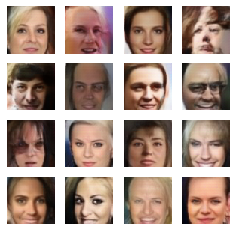

Time for epoch 68 is 152.27052474021912 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


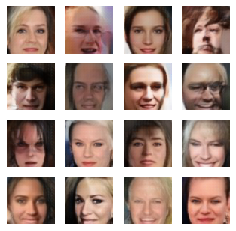

Time for epoch 69 is 152.45205307006836 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


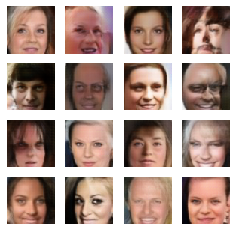

Time for epoch 70 is 152.48240542411804 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


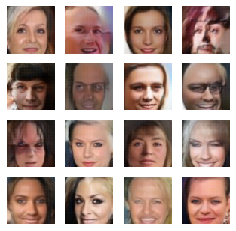

Time for epoch 71 is 152.14961338043213 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


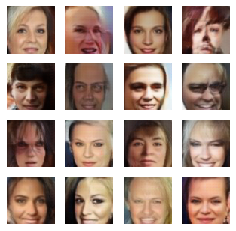

Time for epoch 72 is 152.56371021270752 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


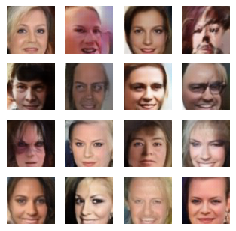

Time for epoch 73 is 152.7000379562378 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


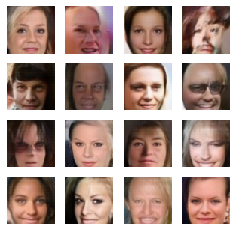

Time for epoch 74 is 152.71079063415527 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


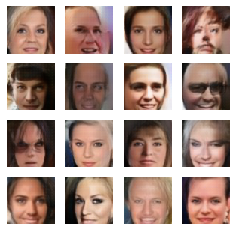

Time for epoch 75 is 153.0795876979828 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


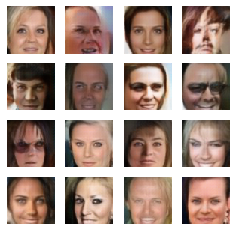

Time for epoch 76 is 153.48694467544556 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


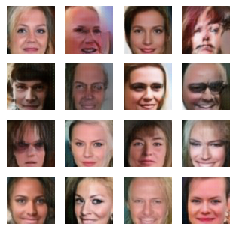

Time for epoch 77 is 152.5382947921753 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


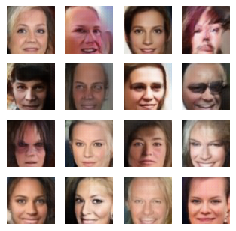

Time for epoch 78 is 152.61584663391113 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


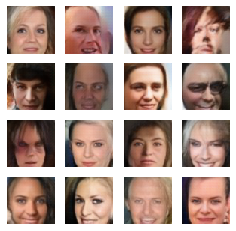

Time for epoch 79 is 152.8585376739502 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


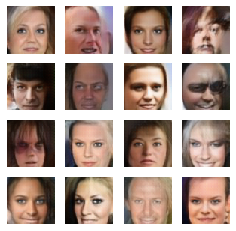

Time for epoch 80 is 152.47907257080078 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


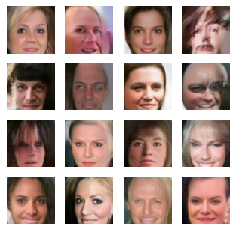

Time for epoch 81 is 152.48261904716492 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


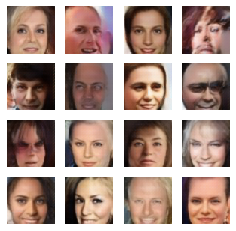

Time for epoch 82 is 152.1823456287384 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


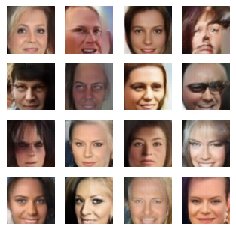

Time for epoch 83 is 152.5707688331604 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


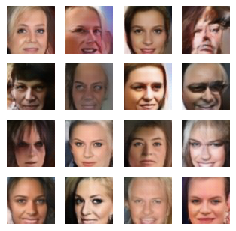

Time for epoch 84 is 152.17068338394165 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


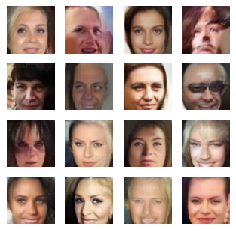

Time for epoch 85 is 152.56616759300232 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


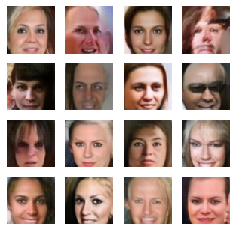

Time for epoch 86 is 152.2319598197937 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


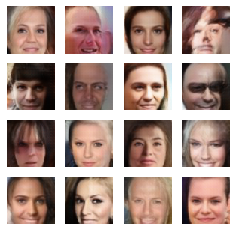

Time for epoch 87 is 152.50817131996155 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


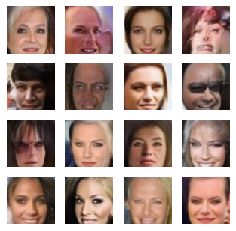

Time for epoch 88 is 153.0089590549469 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


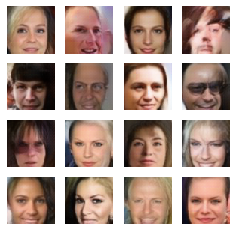

Time for epoch 89 is 152.2029254436493 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


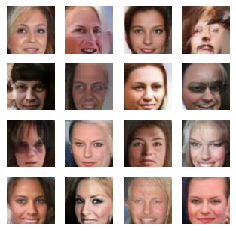

Time for epoch 90 is 153.24458813667297 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


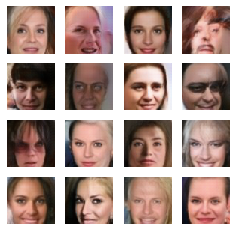

Time for epoch 91 is 152.5579788684845 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


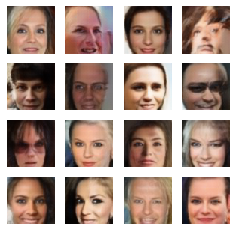

Time for epoch 92 is 152.31316447257996 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


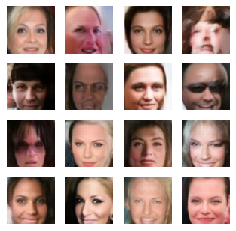

Time for epoch 93 is 152.8940064907074 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


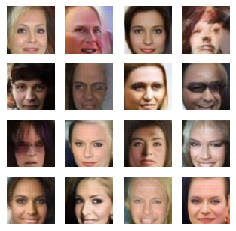

Time for epoch 94 is 153.32074451446533 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


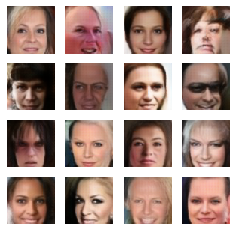

Time for epoch 95 is 152.94134092330933 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


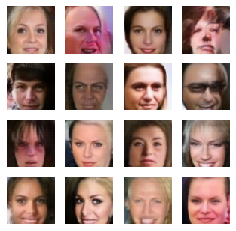

Time for epoch 96 is 152.72192764282227 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


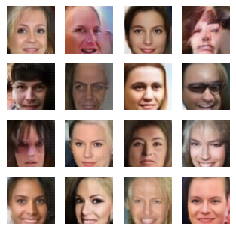

Time for epoch 97 is 153.6023383140564 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


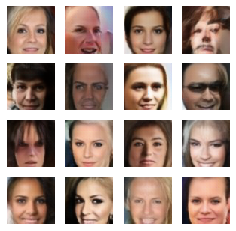

Time for epoch 98 is 152.80399203300476 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


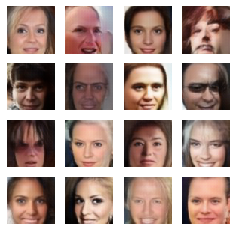

Time for epoch 99 is 152.60106205940247 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


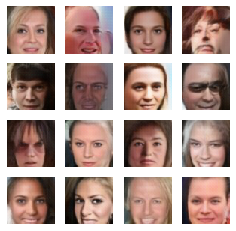

Time for epoch 100 is 152.76669883728027 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


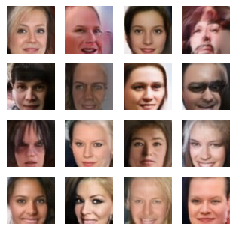

Time for epoch 101 is 151.933447599411 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


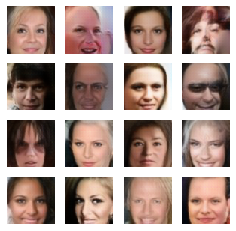

Time for epoch 102 is 152.01973414421082 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


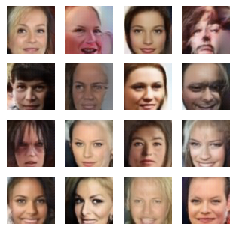

Time for epoch 103 is 151.8104703426361 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


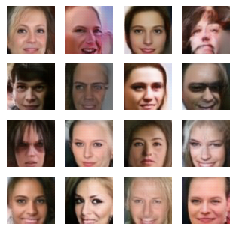

Time for epoch 104 is 152.32161140441895 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


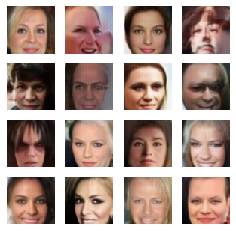

Time for epoch 105 is 152.10466933250427 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


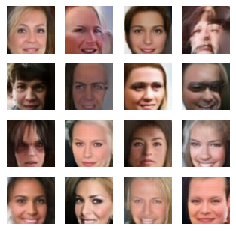

Time for epoch 106 is 152.23204517364502 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


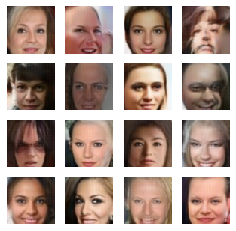

Time for epoch 107 is 152.4308032989502 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


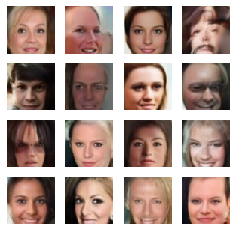

Time for epoch 108 is 153.02871298789978 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


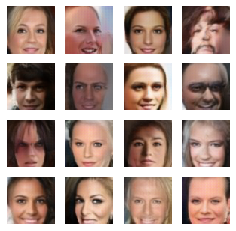

Time for epoch 109 is 152.4321732521057 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


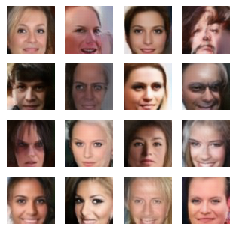

Time for epoch 110 is 152.79007029533386 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


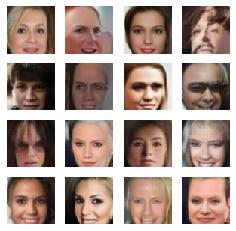

Time for epoch 111 is 153.06401419639587 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


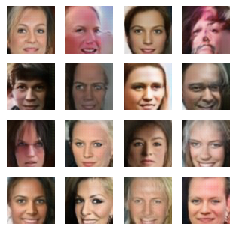

Time for epoch 112 is 152.43570232391357 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


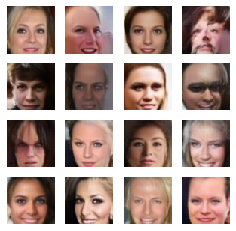

Time for epoch 113 is 152.3578724861145 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


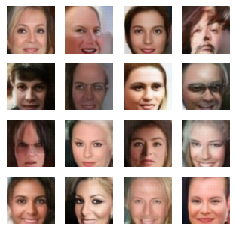

Time for epoch 114 is 152.85791397094727 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


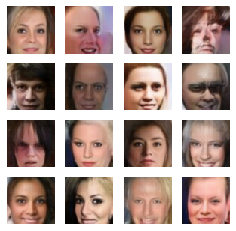

Time for epoch 115 is 152.21284675598145 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


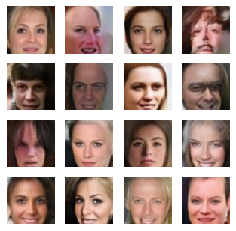

Time for epoch 116 is 152.19035267829895 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


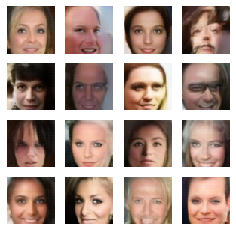

Time for epoch 117 is 152.38237738609314 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


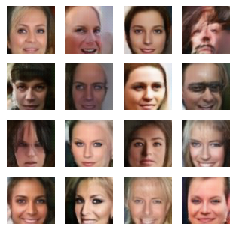

Time for epoch 118 is 152.41289639472961 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


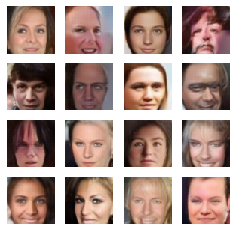

Time for epoch 119 is 152.21623516082764 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


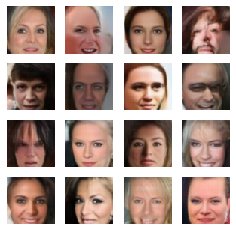

Time for epoch 120 is 152.67547392845154 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


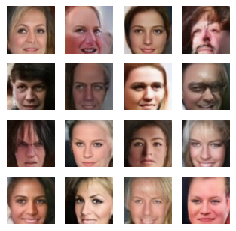

Time for epoch 121 is 152.16713523864746 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


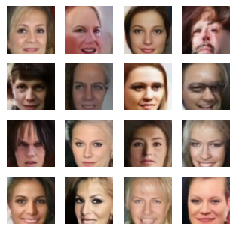

Time for epoch 122 is 151.97454643249512 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


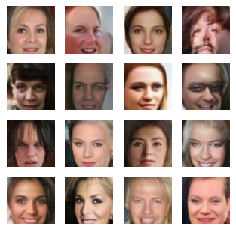

Time for epoch 123 is 151.9744803905487 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


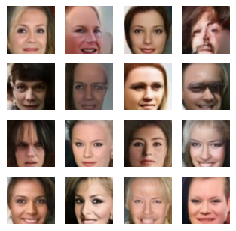

Time for epoch 124 is 152.28184533119202 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


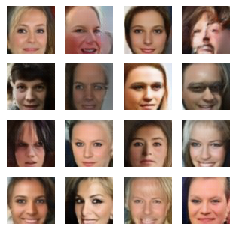

Time for epoch 125 is 152.42302441596985 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


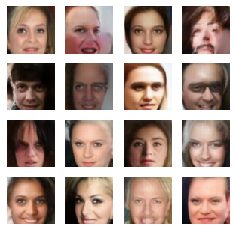

Time for epoch 126 is 152.2447476387024 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


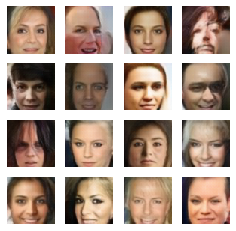

Time for epoch 127 is 152.32222175598145 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


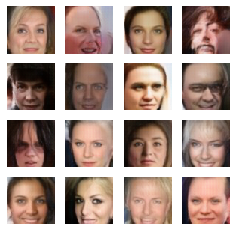

Time for epoch 128 is 152.3259403705597 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


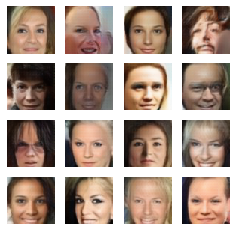

Time for epoch 129 is 152.72757482528687 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


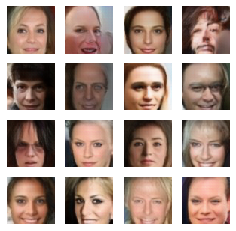

Time for epoch 130 is 152.77538776397705 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


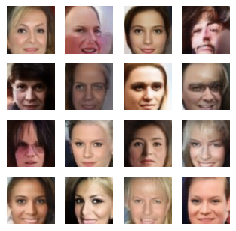

Time for epoch 131 is 152.92549300193787 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


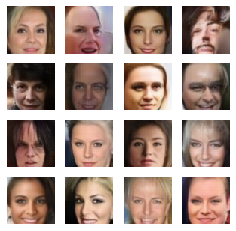

Time for epoch 132 is 152.8886640071869 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


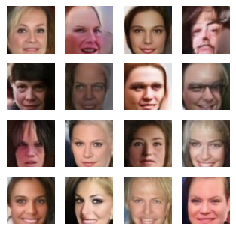

Time for epoch 133 is 152.85101890563965 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


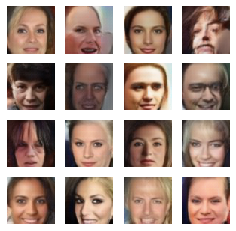

Time for epoch 134 is 152.5310218334198 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


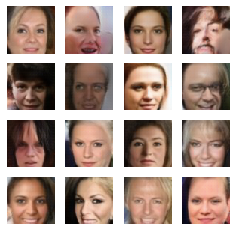

Time for epoch 135 is 152.4460165500641 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


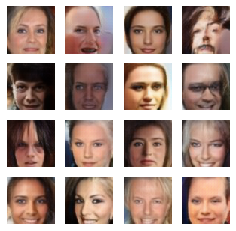

Time for epoch 136 is 152.76423239707947 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


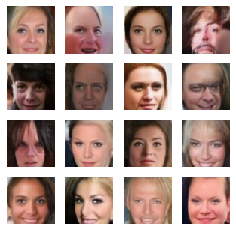

Time for epoch 137 is 152.62794184684753 sec
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Batch 700


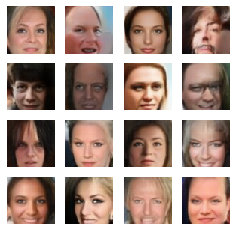

Time for epoch 138 is 153.27737593650818 sec
Batch 100
Batch 200
Batch 300


KeyboardInterrupt: 

In [56]:
%%time
train(train_dataset, EPOCHS)

Restore the latest checkpoint.

In [ ]:
loading_checkpoint = "./training_checkpoints-" + current_time_naming
checkpoint.restore(tf.train.latest_checkpoint(loading_checkpoint))

In [ ]:
for i in range(12, 500):
    noise = tf.random.normal([9, 100])
    test_image = generator(noise, training=False)
    images_array = test_image.numpy()
    my_helper.output_fig(images_array, './final_result/{:03d}_image'.format(i))

In [ ]:
noise = tf.random.normal([100, 100])
test_image = generator(noise, training=False)
images_array = test_image.numpy()
my_helper.output_fig(images_array, 'testing')

## Create a GIF


In [ ]:
# Display a single image using the epoch number
def display_image(epoch_no):
    return PIL.Image.open('image_{:03d}.png'.format(epoch_no))

In [ ]:
display_image(EPOCHS)

Use `imageio` to create an animated gif using the images saved during training.

In [ ]:
anim_file = 'dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob('image*.png')
    filenames = sorted(filenames)
    last = -1
    for i,filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

import IPython
if IPython.version_info > (6,2,0,''):
    display.Image(filename=anim_file)

If you're working in Colab you can download the animation with the code below:

In [ ]:
try:
    from google.colab import files
except ImportError:
    pass
else:
    files.download(anim_file)

## Next steps


This tutorial has shown the complete code necessary to write and train a GAN. As a next step, you might like to experiment with a different dataset, for example the Large-scale Celeb Faces Attributes (CelebA) dataset [available on Kaggle](https://www.kaggle.com/jessicali9530/celeba-dataset/home). To learn more about GANs we recommend the [NIPS 2016 Tutorial: Generative Adversarial Networks](https://arxiv.org/abs/1701.00160).
